# Исследование рынка общепита в Москве

<b>Описание проекта</b>

Инвесторы из фонда «Shut Up and Take My Money» решили попробовать себя в новой области и открыть заведение общественного питания в Москве. Заказчики ещё не знают, что это будет за место: кафе, ресторан, пиццерия, паб или бар, — и какими будут расположение, меню и цены.

Для начала они просят вас — аналитика — подготовить исследование рынка Москвы, найти интересные особенности и презентовать полученные результаты, которые в будущем помогут в выборе подходящего инвесторам места.

Вам доступен датасет с заведениями общественного питания Москвы, составленный на лето 2022 года. Информация размещённая в сервисе Яндекс Бизнес, могла быть добавлена пользователями или найдена в общедоступных источниках. Она носит исключительно справочный характер.

### Загрузите данные и изучите общую информацию

Изучите общую информацию о датасете. Сколько заведений представлено? Что можно сказать о каждом столбце? Значения какого типа они хранят?

In [1]:
import pandas as pd
import seaborn as sns
import plotly.express as px
import json
from matplotlib import pyplot as plt
from plotly import graph_objects as go
from numpy import median, mean
from folium import Map, Choropleth, Marker
from folium.plugins import MarkerCluster
from folium.features import CustomIcon

In [2]:
places = pd.read_csv('/datasets/moscow_places.csv')

display(places.head())
display(places.info())

,name,category,address,district,hours,lat,lng,rating,price,avg_bill,middle_avg_bill,middle_coffee_cup,chain,seats
0,WoWфли,кафе,"Москва, улица Дыбенко, 7/1",Северный административный округ,"ежедневно, 10:00–22:00",55.878494,37.478860,5.0,NaN,NaN,NaN,NaN,0,NaN
1,Четыре комнаты,ресторан,"Москва, улица Дыбенко, 36, корп. 1",Северный административный округ,"ежедневно, 10:00–22:00",55.875801,37.484479,4.5,выше среднего,Средний счёт:1500–1600 ₽,1550.0,NaN,0,4.0
2,Хазри,кафе,"Москва, Клязьминская улица, 15",Северный административный округ,"пн-чт 11:00–02:00; пт,сб 11:00–05:00; вс 11:00...",55.889146,37.525901,4.6,средние,Средний счёт:от 1000 ₽,1000.0,NaN,0,45.0
3,Dormouse Coffee Shop,кофейня,"Москва, улица Маршала Федоренко, 12",Северный административный округ,"ежедневно, 09:00–22:00",55.881608,37.488860,5.0,NaN,Цена чашки капучино:155–185 ₽,NaN,170.0,0,NaN
4,Иль Марко,пиццерия,"Москва, Правобережная улица, 1Б",Северный административный округ,"ежедневно, 10:00–22:00",55.881166,37.449357,5.0,средние,Средний счёт:400–600 ₽,500.0,NaN,1,148.0


<class 'pandas.core.frame.DataFrame'>
RangeIndex: 8406 entries, 0 to 8405
Data columns (total 14 columns):
 #   Column             Non-Null Count  Dtype  
---  ------             --------------  -----  
 0   name               8406 non-null   object 
 1   category           8406 non-null   object 
 2   address            8406 non-null   object 
 3   district           8406 non-null   object 
 4   hours              7870 non-null   object 
 5   lat                8406 non-null   float64
 6   lng                8406 non-null   float64
 7   rating             8406 non-null   float64
 8   price              3315 non-null   object 
 9   avg_bill           3816 non-null   object 
 10  middle_avg_bill    3149 non-null   float64
 11  middle_coffee_cup  535 non-null    float64
 12  chain              8406 non-null   int64  
 13  seats              4795 non-null   float64
dtypes: float64(6), int64(1), object(7)
memory usage: 919.5+ KB


None

Всего в таблице 8406 записей о заведениях. В столбцах name, category, address, district, hours, price и avg_bill представлена текстовая информация, в остальных - числовая. Типы данных корректны, корректировать их не требуется.

### Предобработка данных

Изучите, есть ли дубликаты в данных. Поищите пропуски: встречаются ли они, в каких столбцах? Можно ли их обработать или оставить как есть?

Выполните предобработку данных:

•	Создайте столбец street с названиями улиц из столбца с адресом.

•	Создайте столбец is_24/7 с обозначением, что заведение работает ежедневно и круглосуточно (24/7):

o	логическое значение True — если заведение работает ежедневно и круглосуточно;

o	логическое значение False — в противоположном случае.

#### Дубликаты

In [3]:
places.duplicated().sum()

0

Полные дубликаты в таблице отсутствуют.

Также проверим дубликаты по названию и адресу заведения на случай если есть незначительные расхождения по другим столбцам.

In [4]:
places[['name', 'address']].duplicated().sum()

0

Дубликатов заведений нет.

Также проверим некоторые столбцы на скрытые дубликаты. Посмотрим, сколько уникальных значений по каждому столбцу.

In [5]:
places.nunique()

name                 5614
category                8
address              5753
district                9
hours                1307
lat                  8209
lng                  8258
rating                 41
price                   4
avg_bill              897
middle_avg_bill       230
middle_coffee_cup      96
chain                   2
seats                 229
dtype: int64

Проверим столбцы category, district и price. В остальных объективно слишком много значений, чтобы провести такую проверку.

In [6]:
display(places['category'].unique())
display(places['district'].unique())
display(places['price'].unique())

array(['кафе', 'ресторан', 'кофейня', 'пиццерия', 'бар,паб',
       'быстрое питание', 'булочная', 'столовая'], dtype=object)

array(['Северный административный округ',
       'Северо-Восточный административный округ',
       'Северо-Западный административный округ',
       'Западный административный округ',
       'Центральный административный округ',
       'Восточный административный округ',
       'Юго-Восточный административный округ',
       'Южный административный округ',
       'Юго-Западный административный округ'], dtype=object)

array([nan, 'выше среднего', 'средние', 'высокие', 'низкие'], dtype=object)

Все указанные столбцы не содержат скрытых дубликатов.

#### Пропуски

Опираясь на информацию о таблице из пункта 1, пропуски есть в столбцах hours, price, avg_bill, middle_avg_bill, middle_coffee_cup и seats.

В столбце hours пропущено около 600 значений, меньше 10% от общего количества записей. Пропуски можно было бы заполнить медианными значения по категории заведения и району нахождения, но данные в этом столбце не числовые и провести такое сопоставление будет достаточно трудоемко. Исключать заведения с пропусками тоже не хотелось бы, это повлияет на статистику. Предлагаю заполнить пропуски плейсхолдером "Не указано".

В столбцах price и avg_bill пропущено больше половины значений, заполнять их средними или медианными значениями нецелесообразно, поскольку полностью размоет статистику по заведениям. Предлагаю, как и в столбце hours, заполнить пропуски плейсхолдером "Не указано".

Столбцы middle_avg_bill и middle_coffee_cup являются производными от столбца avg_bill, и их тоже было бы неплохо заполнить плейсхолдерами, но так как это столбцы с числовыми значениями, таким плейсхолдером предлагаю использовать значение "-1".

В столбце seats тоже пропущено много значений и заполнение средними или медианными значениями будет плохо сказываться на статистике. Предлагаю также использовать плейсхолдер "-1".

In [7]:
places['hours'] = places['hours'].fillna('не указано')
places['price'] = places['price'].fillna('не указано')
places['avg_bill'] = places['avg_bill'].fillna('не указано')
places['middle_avg_bill'] = places['middle_avg_bill'].fillna(-1)
places['middle_coffee_cup'] = places['middle_coffee_cup'].fillna(-1)
places['seats'] = places['seats'].fillna(-1)
display(places.head())
display(places.info())

,name,category,address,district,hours,lat,lng,rating,price,avg_bill,middle_avg_bill,middle_coffee_cup,chain,seats
0,WoWфли,кафе,"Москва, улица Дыбенко, 7/1",Северный административный округ,"ежедневно, 10:00–22:00",55.878494,37.478860,5.0,не указано,не указано,-1.0,-1.0,0,-1.0
1,Четыре комнаты,ресторан,"Москва, улица Дыбенко, 36, корп. 1",Северный административный округ,"ежедневно, 10:00–22:00",55.875801,37.484479,4.5,выше среднего,Средний счёт:1500–1600 ₽,1550.0,-1.0,0,4.0
2,Хазри,кафе,"Москва, Клязьминская улица, 15",Северный административный округ,"пн-чт 11:00–02:00; пт,сб 11:00–05:00; вс 11:00...",55.889146,37.525901,4.6,средние,Средний счёт:от 1000 ₽,1000.0,-1.0,0,45.0
3,Dormouse Coffee Shop,кофейня,"Москва, улица Маршала Федоренко, 12",Северный административный округ,"ежедневно, 09:00–22:00",55.881608,37.488860,5.0,не указано,Цена чашки капучино:155–185 ₽,-1.0,170.0,0,-1.0
4,Иль Марко,пиццерия,"Москва, Правобережная улица, 1Б",Северный административный округ,"ежедневно, 10:00–22:00",55.881166,37.449357,5.0,средние,Средний счёт:400–600 ₽,500.0,-1.0,1,148.0


<class 'pandas.core.frame.DataFrame'>
RangeIndex: 8406 entries, 0 to 8405
Data columns (total 14 columns):
 #   Column             Non-Null Count  Dtype  
---  ------             --------------  -----  
 0   name               8406 non-null   object 
 1   category           8406 non-null   object 
 2   address            8406 non-null   object 
 3   district           8406 non-null   object 
 4   hours              8406 non-null   object 
 5   lat                8406 non-null   float64
 6   lng                8406 non-null   float64
 7   rating             8406 non-null   float64
 8   price              8406 non-null   object 
 9   avg_bill           8406 non-null   object 
 10  middle_avg_bill    8406 non-null   float64
 11  middle_coffee_cup  8406 non-null   float64
 12  chain              8406 non-null   int64  
 13  seats              8406 non-null   float64
dtypes: float64(6), int64(1), object(7)
memory usage: 919.5+ KB


None

#### Дополнительные столбцы

In [8]:
places['street'] = places['address'].apply(lambda x: x.split(', ')[1])
places['is_24_7'] = places['hours'] == 'ежедневно, круглосуточно'
display(places.head())
display(places.info())

,name,category,address,district,hours,lat,lng,rating,price,avg_bill,middle_avg_bill,middle_coffee_cup,chain,seats,street,is_24_7
0,WoWфли,кафе,"Москва, улица Дыбенко, 7/1",Северный административный округ,"ежедневно, 10:00–22:00",55.878494,37.478860,5.0,не указано,не указано,-1.0,-1.0,0,-1.0,улица Дыбенко,False
1,Четыре комнаты,ресторан,"Москва, улица Дыбенко, 36, корп. 1",Северный административный округ,"ежедневно, 10:00–22:00",55.875801,37.484479,4.5,выше среднего,Средний счёт:1500–1600 ₽,1550.0,-1.0,0,4.0,улица Дыбенко,False
2,Хазри,кафе,"Москва, Клязьминская улица, 15",Северный административный округ,"пн-чт 11:00–02:00; пт,сб 11:00–05:00; вс 11:00...",55.889146,37.525901,4.6,средние,Средний счёт:от 1000 ₽,1000.0,-1.0,0,45.0,Клязьминская улица,False
3,Dormouse Coffee Shop,кофейня,"Москва, улица Маршала Федоренко, 12",Северный административный округ,"ежедневно, 09:00–22:00",55.881608,37.488860,5.0,не указано,Цена чашки капучино:155–185 ₽,-1.0,170.0,0,-1.0,улица Маршала Федоренко,False
4,Иль Марко,пиццерия,"Москва, Правобережная улица, 1Б",Северный административный округ,"ежедневно, 10:00–22:00",55.881166,37.449357,5.0,средние,Средний счёт:400–600 ₽,500.0,-1.0,1,148.0,Правобережная улица,False


<class 'pandas.core.frame.DataFrame'>
RangeIndex: 8406 entries, 0 to 8405
Data columns (total 16 columns):
 #   Column             Non-Null Count  Dtype  
---  ------             --------------  -----  
 0   name               8406 non-null   object 
 1   category           8406 non-null   object 
 2   address            8406 non-null   object 
 3   district           8406 non-null   object 
 4   hours              8406 non-null   object 
 5   lat                8406 non-null   float64
 6   lng                8406 non-null   float64
 7   rating             8406 non-null   float64
 8   price              8406 non-null   object 
 9   avg_bill           8406 non-null   object 
 10  middle_avg_bill    8406 non-null   float64
 11  middle_coffee_cup  8406 non-null   float64
 12  chain              8406 non-null   int64  
 13  seats              8406 non-null   float64
 14  street             8406 non-null   object 
 15  is_24_7            8406 non-null   bool   
dtypes: bool(1), float64(6), 

None

Столбцы заполнены без пропусков.

### Анализ данных

#### Категории заведений

In [9]:
places_on_cat = places.groupby('category')['name'].count()
fig = go.Figure(go.Pie(labels=places_on_cat.index, values=places_on_cat, insidetextorientation='tangential', hole=0.5))
fig.update_traces(textinfo='value+percent', textposition='inside')
fig.update_layout(title_text='Распределение заведений по категориям',
                  width=800,
                  height=600,
                  annotations=[dict(text='Категории', x=1.18, y=1.05, font_size=15, showarrow=False)])
fig.show()

В целом, хорошо выделяются три категории заведений, кафе, рестораны и кофейни. Они с хорошим отрывом превосходят остальные категории по количеству и, соответвенно, доле заведений. Вместе они занимают почти 70% рассматриваемых заведений.

#### Посадочные места

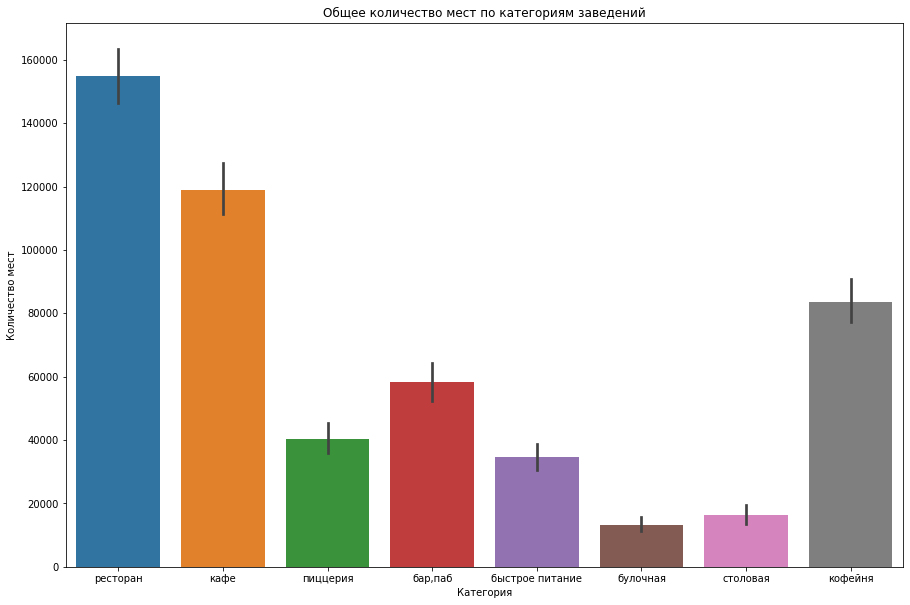

In [10]:
plt.rcParams['figure.figsize'] = (15,10)
sns.barplot(x='category', y='seats', data=places.query('seats >= 0'), estimator=sum)
plt.xlabel('Категория')
plt.ylabel('Количество мест')
plt.title('Общее количество мест по категориям заведений')
plt.show()

По общему количеству мест рестораны резко выходят на первое место, у них на четверть больше посадочных мест, чем в кафе и в полтора раза больше, чем в кофейнях.

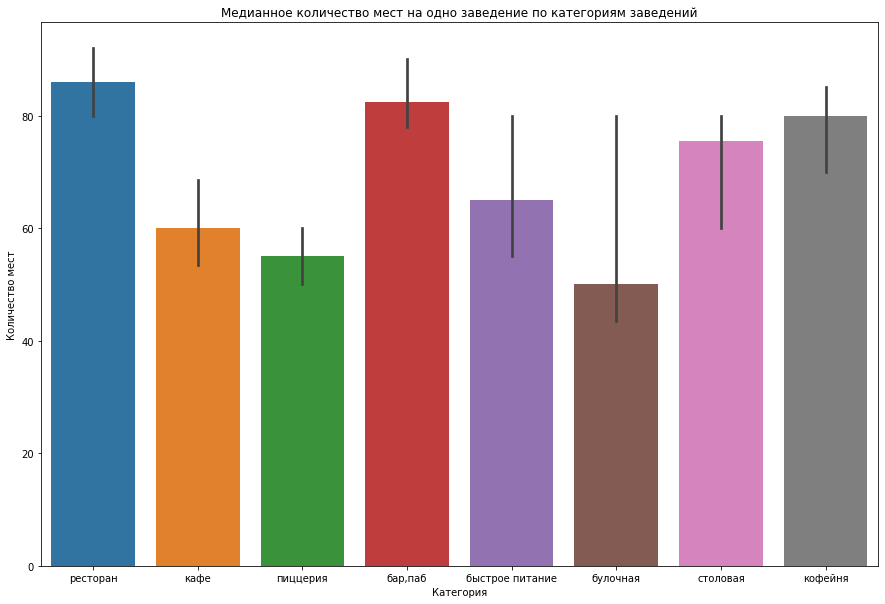

In [11]:
plt.rcParams['figure.figsize'] = (15,10)
sns.barplot(x='category', y='seats', data=places.query('seats >= 0'), estimator=median)
plt.xlabel('Категория')
plt.ylabel('Количество мест')
plt.title('Медианное количество мест на одно заведение по категориям заведений')
plt.show()

Доминация ресторанов по общему количеству мест объяснима, учитывая большое количество самих ресторанов, у них к тому же самое высокое медианное значение мест на заведение.

Близкое к ресторанам медианное значение мест показывают бары, кофейни и столовые. Остальные типы заведений имеют заметно меньшее количество мест.

#### Сетевые заведения

In [12]:
places_on_chain = places.groupby('chain')['name'].count()
fig = go.Figure(go.Pie(labels=['Не сетевые', 'Сетевые'], values=places_on_chain, insidetextorientation='horizontal'))
fig.update_traces(textinfo='value+percent', textposition='inside')
fig.update_layout(title_text='Соотношение сетевых и не сетевых заведений',
                  width=800,
                  height=600,
                  annotations=[dict(text='Категории', x=1.16, y=1.05, font_size=15, showarrow=False)])
fig.show()

Немногим больше трети всех заведений - сетевые.

Посмотрим на соотношения в разных категориях.

In [13]:
places_on_chain_cat = places.groupby(['category','chain'])['name'].count().reset_index()
places_on_chain_cat['chain'] = places_on_chain_cat['chain'].replace({0:'Не сетевые', 1:'Сетевые'})
fig = px.bar(places_on_chain_cat, x='category', y='name', color='chain', text='name')
fig.update_layout(title_text='Количество сетевых и не сетевых заведений по категориям',
                  xaxis_title='Категория',
                  yaxis_title='Количество заведений',
                  width=800,
                  height=600,
                  legend_title_text='Тип заведения')
fig.show()

Самыми сетевыми категориями являются булочные (сетевых в полтора раза больше частных), кофейни и пиццерии (в этих категориях сетевых и частных заведений почти попровну).

Самые не сетевые категории - бары и столовые: количество чатсных заведений почти в 4 раза превышает количество сетевых.

Соотношение сетевых и не сетевых заведений по категориям хорошо показывает следующий график.

In [14]:
fig = px.sunburst(places_on_chain_cat, path=['category', 'chain'], values='name')
fig.update_layout(title_text='Соотношение сетевых и не сетевых заведений по категориям',
                  width=800,
                  height=600)

#### Популярные сети

In [15]:
top_chain = places.query('chain == 1').groupby('name')['address'].count().sort_values().tail(15)
fig = px.bar(top_chain.reset_index(), y='name', x='address', text='address')
fig.update_traces(textfont_size=12, textangle=0, textposition="outside", cliponaxis=False)
fig.update_layout(title_text='Количество заведений в самых популярных сетях',
                  xaxis_title='Количество заведений',
                  yaxis_title='Название сети',
                  width=950,
                  height=600)
fig.show()

Среди сетей самая распространённая - Шоколадница, она с большим отрывом занимает первое место со 120 заведениями. За ней идёт довольно плотная пятёрка Домино'с Пицца, Додо пицца, One Price Coffee, Яндекс Лавка и Cofix. Далее количество заведений по сетям плавно снижается. На 15 месте сеть Му-Му с 27 заведениями.

In [16]:
top_chain_cat = places.query('chain == 1 and name in @top_chain.index').groupby(['name', 'category'])['address'].count().reset_index()
fig = px.bar(top_chain_cat, x='name', y='address', color='category')
fig.update_layout(title_text='Количество сетевых и не сетевых заведений по категориям',
                  xaxis_title='Категория',
                  yaxis_title='Количество заведений',
                  width=800,
                  height=800,
                  legend_title_text='Тип заведения')
fig.show()

В основном сети придерживаются одного формата заведений, но есть исключения - сети Хинкальная и Му-Му по разному позиционируют свои заведения, возможно, в зависимости от их расположения.

#### Заведения по районам

In [17]:
places_on_dist_cat = places.groupby(['district','category'])['name'].count().reset_index()
fig = px.bar(places_on_dist_cat, x='district', y='name', color='category', text='name')
fig.update_layout(title_text='Количество заведений по районам и категориям',
                  xaxis_title='Район города',
                  yaxis_title='Количество заведений',
                  width=900,
                  height=1000,
                  legend_title_text='Категория заведения',
                  uniformtext_minsize=8, uniformtext_mode='hide')
fig.show()

Сразу заметно, что в Центральном округе заведений более чем в два раза больше, чем в остальных районах. Меньше всего в Северо-Западном районе.

Что общее для всех - заметные доли среди других категорий занимают рестораны, кафе и кофейни. Дополнительно к ним в Центральном райцоне выделяются бары.

#### Средние рейтинги

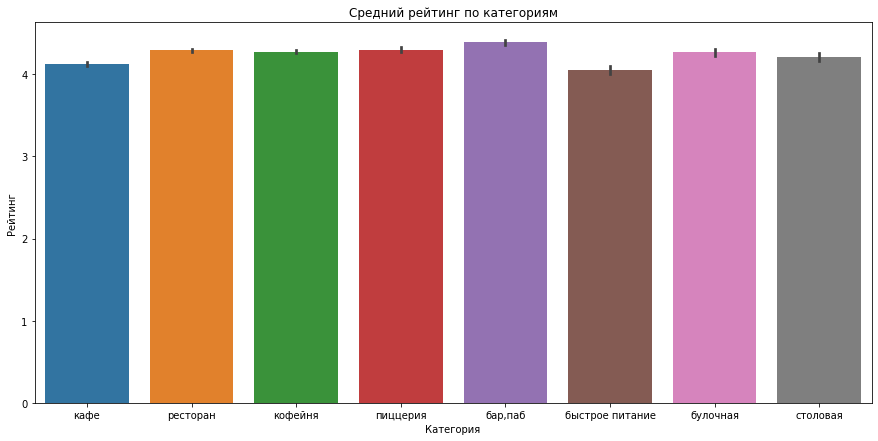

In [18]:
plt.rcParams['figure.figsize'] = (15,7)
sns.barplot(x='category', y='rating', data=places, estimator=mean)
plt.xlabel('Категория')
plt.ylabel('Рейтинг')
plt.title('Средний рейтинг по категориям')
plt.show()

Разброс в среднем рейтинге среди заведений очень мал, у всех категорий средний рейтинг выше 4. Самый плохой - у заведений быстрого питания, самый хороший - у баров. Это может быть связано с тем, что в заведениях быстрого питания упор делается на скорости подачи еды, и не на качестве обслуживания, а в барах наоборот, посетители после весёлого вечера оставляют хорошие отзывы.

In [19]:
state_geo = '/datasets/admin_level_geomap.geojson'
moscow_lat, moscow_lng = 55.751244, 37.618423

moscow_map_rate = Map(location=[moscow_lat, moscow_lng], zoom_start=10)

places_on_dist_rate = places.groupby('district')['rating'].mean().reset_index()
Choropleth(
    geo_data=state_geo,
    data=places_on_dist_rate,
    columns=['district', 'rating'],
    key_on='feature.name',
    fill_color='YlGn',
    fill_opacity=0.8,
    legend_name='Средний рейтинг заведений по районам',
).add_to(moscow_map_rate)

moscow_map_rate

Рейтинги по районам хорошо показывают отрыв Центрального района, отзывы посетителей здесь заметно выше. Самые малооценённый - Юго-восточный район.

Дополнительно отмечу, что рейтинг ЦАО может быть выше из-за большой доли баров (самая оценённая катеория) и малой доли заведений быстрого питания (самая не любимая категория).

#### Заведения на карте

In [20]:
moscow_map_marker = Map(location=[moscow_lat, moscow_lng], zoom_start=10)
marker_cluster_all = MarkerCluster().add_to(moscow_map_marker)
def create_clusters_all(row):
    Marker(
        [row['lat'], row['lng']],
        popup=f"{row['name']} {row['rating']}",
    ).add_to(marker_cluster_all)

places.apply(create_clusters_all, axis=1)
moscow_map_marker

Данные с карты подтверждают данные графиков - заведения сильно "жмутся" к центру города - кластеры там самые большие. Также заметно, что кластеры заведений в районах соответствуют крупным жилым массивам.

#### Данные по улицам

<function matplotlib.pyplot.show(close=None, block=None)>

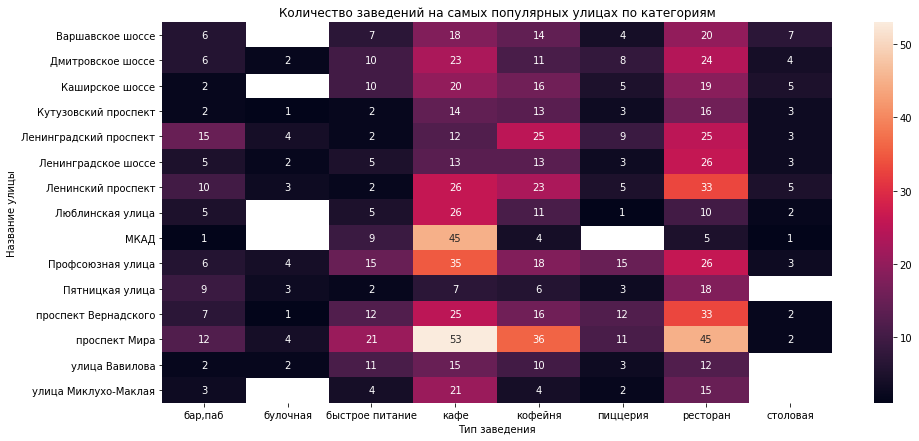

In [21]:
top_street = places.groupby('street')['address'].count().sort_values().tail(15)
top_street_cat = sns.heatmap(places.query('street in @top_street.index').pivot_table(index='street', columns='category', aggfunc='count')['address'], annot=True)
plt.title('Количество заведений на самых популярных улицах по категориям')
plt.xlabel('Тип заведения')
plt.ylabel('Название улицы')
plt.show

На 15 самых популярных улицах чаще всего встречаются кафе, рестораны и кофейни, а вот булочных и столовых почти нет.

In [22]:
low_street = places.groupby('street')['address'].count().sort_values().reset_index().query('address == 1')
low_street_places = places.query('street in @low_street["street"]')

fig = px.bar(low_street_places.groupby('category')['name'].count().reset_index(), x='category', y='name', text='name')
fig.update_layout(title_text='Количество заведений на непопулярных улицах по категориям',
                  xaxis_title='Тип заведения',
                  yaxis_title='Количество заведений',
                  width=900,
                  height=1000,
                  uniformtext_minsize=8, uniformtext_mode='hide')
fig.show()

На улицах, где находится только одно заведение ситуация похожая - больше всего кафе, ресторанов и кофеен. Также мало булочных. Зато чаще по сравнению с популярными улицами попадаются столовые и бары.

In [23]:
fig = go.Figure(go.Pie(labels=['Не сетевые', 'Сетевые'], values=low_street_places.groupby('chain')['name'].count(), insidetextorientation='horizontal'))
fig.update_traces(textinfo='value+percent', textposition='inside')
fig.update_layout(title_text='Соотношение сетевых и не сетевых заведений',
                  width=800,
                  height=600,
                  annotations=[dict(text='Категории', x=1.16, y=1.05, font_size=15, showarrow=False)])
fig.show()

Среди этих заведений немного ниже доля сетевых, чем в общем по таблице.

In [24]:
low_street_map_marker = Map(location=[moscow_lat, moscow_lng], zoom_start=10)
marker_cluster_low = MarkerCluster().add_to(low_street_map_marker)
def create_clusters_low(row):
    Marker(
        [row['lat'], row['lng']],
        popup=f"{row['name']} {row['rating']}",
    ).add_to(marker_cluster_low)

low_street_places.apply(create_clusters_low, axis=1)
low_street_map_marker

Также эти заведения тяготеют к районам, где много мелких улочек, что в целом объясняет, почему они на таких улицах могут быть единственными.

#### Средний чек

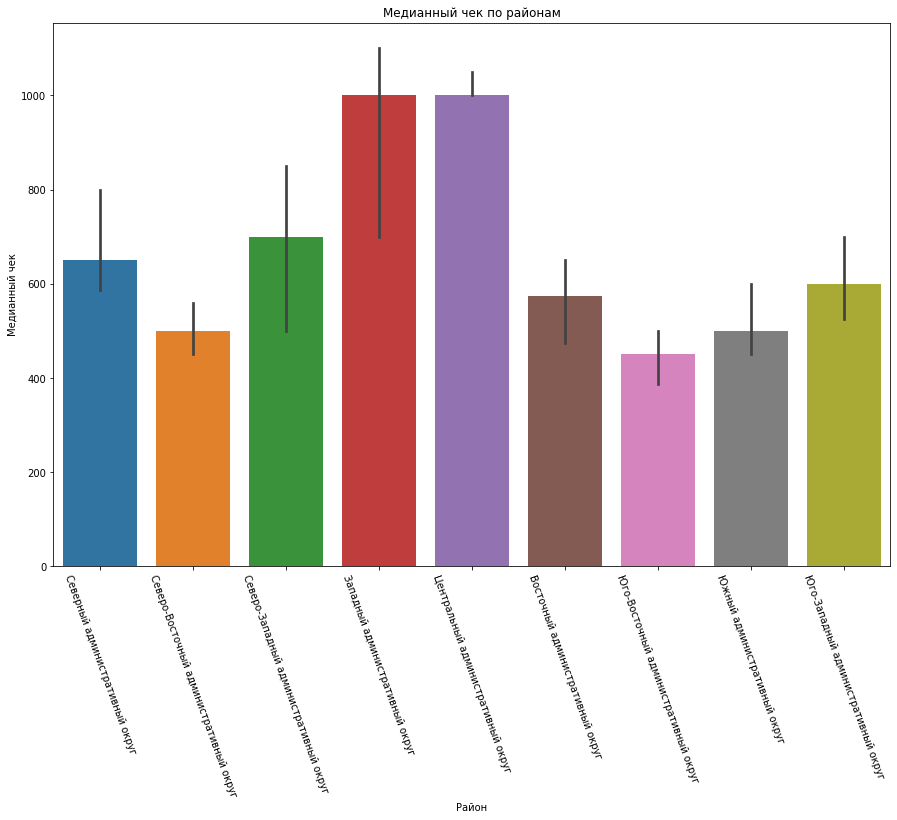

In [25]:
places_avg_bill = places.query('middle_avg_bill >= 0')
plt.rcParams['figure.figsize'] = (15,10)
sns.barplot(x='district', y='middle_avg_bill', data=places_avg_bill, estimator=median)
plt.xlabel('Район')
plt.ylabel('Медианный чек')
plt.title('Медианный чек по районам')
plt.xticks(rotation = -70)
plt.show()

В Центральном и Западном округах медианный чек заметно выше, чем в остальных районах. Настолько, что кажется, будто все остальные районы располагаются плотной группой и цены в них похожие. Но всё равно, в Юго-восточном, Южном и Северо-восточном округах поесть можно заметно дешевле, чем в оставльных.

In [26]:
moscow_map_avg_bill = Map(location=[moscow_lat, moscow_lng], zoom_start=10)

places_on_dist_avg_bill = places_avg_bill.groupby('district')['middle_avg_bill'].median().reset_index()
Choropleth(
    geo_data=state_geo,
    data=places_on_dist_avg_bill,
    columns=['district', 'middle_avg_bill'],
    key_on='feature.name',
    fill_color='YlGn',
    fill_opacity=0.8,
    legend_name='Медианный чек по районам',
).add_to(moscow_map_avg_bill)

moscow_map_avg_bill

Данные на карте это подтверждают, подсвечивая три заметные ценовые группы.

#### Круглосуточные заведения

In [27]:
fig = go.Figure(go.Pie(labels=['Не круглосуточные', 'Круглосуточные'], values=places.groupby('is_24_7')['name'].count(), insidetextorientation='horizontal'))
fig.update_traces(textinfo='value+percent', textposition='inside')
fig.update_layout(title_text='Доля круглосуточных заведений',
                  width=800,
                  height=600,
                  annotations=[dict(text='Категории', x=1.16, y=1.05, font_size=15, showarrow=False)])
fig.show()

В целом, круглосуточных заведений немного, меньше 10%.

In [28]:
places_24_7 = places.query('is_24_7 == True')

fig = px.bar(places_24_7.groupby('category')['name'].count().reset_index(), x='category', y='name', text='name')
fig.update_layout(title_text='Количество круглосуточных заведений по категориям',
                  xaxis_title='Тип заведения',
                  yaxis_title='Количество заведений',
                  width=900,
                  height=600,
                  uniformtext_minsize=8, uniformtext_mode='hide')
fig.show()

Среди круглосуточных заведений ожидаемо больше всего кафе и довольно много ресторанов, эти группы хорошо представлены в данных и ожидаемо разнообразны, но остальное распределение не так типично. На втором месте по количеству круглосуточных заведений занимают заведения быстрого питания. Остальные категории здесь представлены слабее. Очень мало круглосуточных столовых.

In [29]:
fig = go.Figure(go.Pie(labels=['Не сетевые', 'Сетевые'], values=places_24_7.groupby('chain')['name'].count(), insidetextorientation='horizontal'))
fig.update_traces(textinfo='value+percent', textposition='inside')
fig.update_layout(title_text='Соотношение сетевых и не сетевых заведений',
                  width=800,
                  height=600,
                  annotations=[dict(text='Категории', x=1.16, y=1.05, font_size=15, showarrow=False)])
fig.show()

Среди круглосуточных заведений довольно много сетевых, больше, чем в общем по таблице.

In [30]:
places_24_7_map_marker = Map(location=[moscow_lat, moscow_lng], zoom_start=10)
marker_cluster_24_7 = MarkerCluster().add_to(places_24_7_map_marker)
def create_clusters_24_7(row):
    Marker(
        [row['lat'], row['lng']],
        popup=f"{row['name']} {row['rating']}",
    ).add_to(marker_cluster_24_7)

places_24_7.apply(create_clusters_24_7, axis=1)
places_24_7_map_marker

Распределение по карте круглосуточных заведений похоже на распределение в общем по таблице - их больше в центре и меньше на северо-западе.

#### Общий вывод

Сама по себе Москва - это довольно конкурентный рынок общепита. Большое количество заведений разнообразных видов с высокими средними рейтингами настраивают посетителей на высокий уровень ожиданий.

Можно выделить один округ с самой высокой конкуренцией среди заведений - Центральный: больше всего заведений, разнообразие их видов, самые высокие рейтинги, и при этом высокий средний чек. Открытие заведения в таком районе - большой риск.

Но есть другой район с тем же уровнем цен, а значит, с потенциально высокой прибылью - Западный округ. Но по сравнению с Центральным округом количество заведений здесь заметно меньше, как и их средний рейтинг. Открытие заведения в таком районе было бы менее рискованно.

Другой вопрос - категория заведения. На мой взгляд, хорошим спросом могут пользоваться заведения из тех категорий, которые сейчас представлены в основном сетевыми местами: булочные, пиццерии и кофейни. При этом, стоит отметить что кофеен в принципе довольно много, но оригинальное и отличающееся от сетевого место может привлечь посетителей даже в таких условиях.

### Детализируем исследование: открытие кофейни

Основателям фонда «Shut Up and Take My Money» не даёт покоя успех сериала «Друзья». Их мечта — открыть такую же крутую и доступную, как «Central Perk», кофейню в Москве. Будем считать, что заказчики не боятся конкуренции в этой сфере, ведь кофеен в больших городах уже достаточно. Попробуем определить, осуществима ли мечта клиентов.

#### О кофейнях в общем

In [31]:
places_coffee = places.query('category == "кофейня"')

fig = px.bar(places_coffee.groupby('district')['name'].count().reset_index(), x='district', y='name', text='name')
fig.update_layout(title_text='Количество кофеен по районам',
                  xaxis_title='Район',
                  yaxis_title='Количество кофеен',
                  width=900,
                  height=600,
                  uniformtext_minsize=8, uniformtext_mode='hide')
fig.show()

In [32]:
coffee_map_marker = Map(location=[moscow_lat, moscow_lng], zoom_start=10)
marker_cluster_coffee = MarkerCluster().add_to(coffee_map_marker)
def create_clusters_coffee(row):
    icon_url = 'https://img.icons8.com/ios-glyphs/512/coffee-pot.png'  
    icon = CustomIcon(icon_url, icon_size=(30, 30))
    Marker(
        [row['lat'], row['lng']],
        popup=f"{row['name']} {row['rating']}",
        icon=icon,
    ).add_to(marker_cluster_coffee)

places_coffee.apply(create_clusters_coffee, axis=1)
coffee_map_marker

Также как и остальные заведения, кофейни тяготеют к центру города. Довольно много кофеен на севере и юго-западе. На остальных направлениях, даже в крупных жилых районах кофеен сильно меньше.

In [33]:
fig = go.Figure(go.Pie(labels=['Не круглосуточные', 'Круглосуточные'], values=places_coffee.groupby('is_24_7')['name'].count(), insidetextorientation='horizontal'))
fig.update_traces(textinfo='value+percent', textposition='inside')
fig.update_layout(title_text='Доля круглосуточных кофеен',
                  width=800,
                  height=600,
                  annotations=[dict(text='Категории', x=1.16, y=1.05, font_size=15, showarrow=False)])
fig.show()

Доля круглосуточных кофеен заметно ниже, чем в целом по заведениям таблицы. Это можно объяснить тем, что посетителям обычно хочется взбодриться с утра или днём, думаю, что ночью таких желающих не так много. Давайте посмотрим, где находятся круглосуточные кофейни.

In [34]:
coffee_247_map_marker = Map(location=[moscow_lat, moscow_lng], zoom_start=10)
marker_cluster_coffee_247 = MarkerCluster().add_to(coffee_247_map_marker)
def create_clusters_coffee_247(row):
    icon_url = 'https://img.icons8.com/ios-glyphs/512/coffee-pot.png'  
    icon = CustomIcon(icon_url, icon_size=(30, 30))
    Marker(
        [row['lat'], row['lng']],
        popup=f"{row['name']} {row['rating']}",
        icon=icon,
    ).add_to(coffee_247_map_marker)

places_coffee_247 = places_coffee.query('is_24_7 == True')
places_coffee_247.apply(create_clusters_coffee_247, axis=1)
coffee_247_map_marker

Подавляющее большинство таких кофеен находится в центре,в спальных районах их очень мало. В целом, такие заведния чаще находятся рядом с крупными улицами, на вокзалах и других транспортных развязках.

#### Рейтинги кофеен

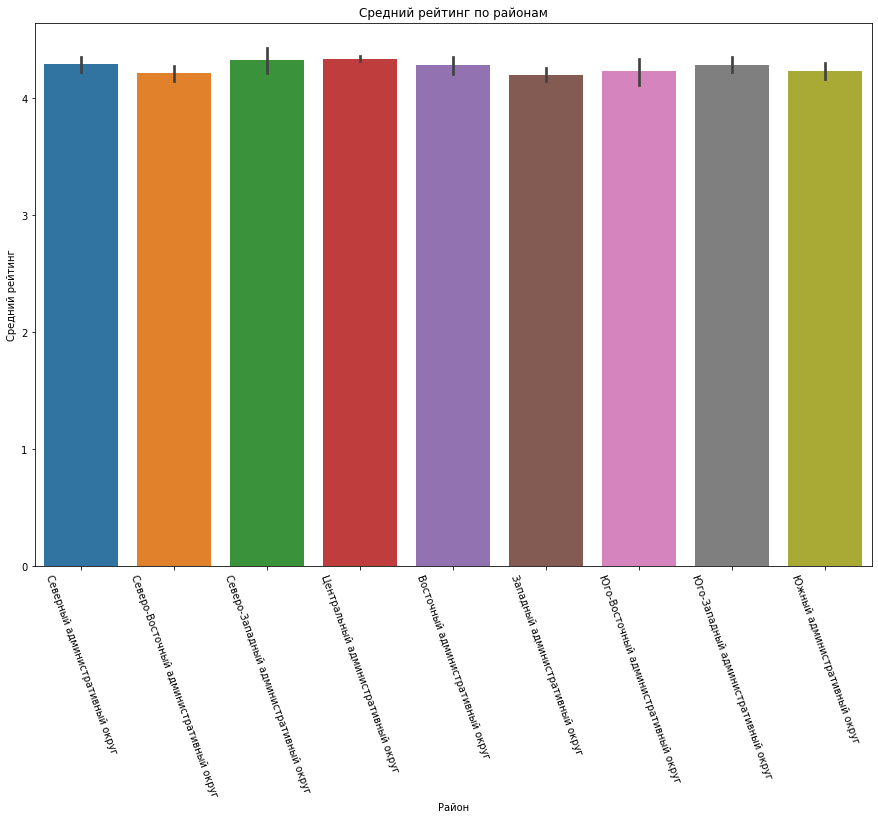

In [35]:
plt.rcParams['figure.figsize'] = (15,10)
sns.barplot(x='district', y='rating', data=places_coffee, estimator=mean)
plt.xlabel('Район')
plt.ylabel('Средний рейтинг')
plt.title('Средний рейтинг по районам')
plt.xticks(rotation = -70)
plt.show()

В целом, средние рейтинги кофеен по районам довольно ровные, разброс между ними очень маленький.

In [36]:
moscow_map_coffee_rating = Map(location=[moscow_lat, moscow_lng], zoom_start=10)

places_on_dist_coffee_rate = places_coffee.groupby('district')['rating'].mean().reset_index()
Choropleth(
    geo_data=state_geo,
    data=places_on_dist_coffee_rate,
    columns=['district', 'rating'],
    key_on='feature.name',
    fill_color='YlGn',
    fill_opacity=0.8,
    legend_name='Средний рейтинг кофеен по районам',
).add_to(moscow_map_coffee_rating)

moscow_map_coffee_rating

На карте лучше заметна разница между рейтингами по районам. Есть как заметные лидеры, так и аутсайдеры, но важно отметить - самый низкий и самый высокий средние рейтинги отличаются всего на 0,14, что делает их практически равными.

#### Стоимость чашки каппучино

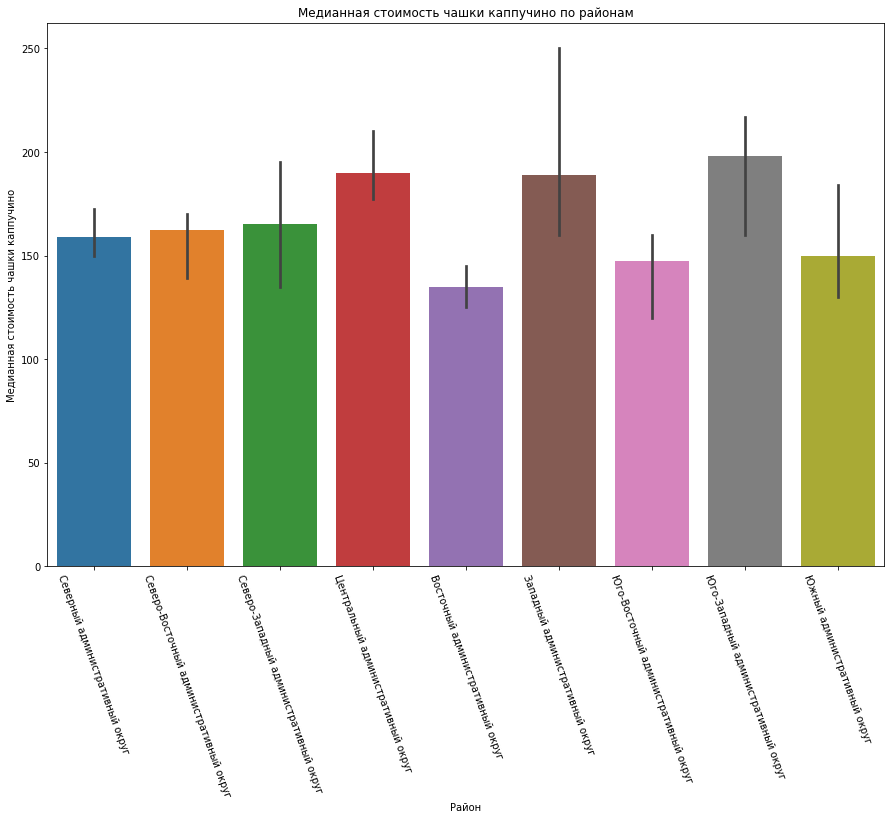

In [37]:
places_coffee_cup = places_coffee.query('middle_coffee_cup >= 0')
plt.rcParams['figure.figsize'] = (15,10)
sns.barplot(x='district', y='middle_coffee_cup', data=places_coffee_cup, estimator=median)
plt.xlabel('Район')
plt.ylabel('Медианная стоимость чашки каппучино')
plt.title('Медианная стоимость чашки каппучино по районам')
plt.xticks(rotation = -70)
plt.show()

In [38]:
moscow_map_coffee_cup = Map(location=[moscow_lat, moscow_lng], zoom_start=10)

places_on_dist_coffee_cup = places_coffee_cup.groupby('district')['middle_coffee_cup'].median().reset_index()
Choropleth(
    geo_data=state_geo,
    data=places_on_dist_coffee_cup,
    columns=['district', 'middle_coffee_cup'],
    key_on='feature.name',
    fill_color='YlGn',
    fill_opacity=0.8,
    legend_name='Медианная стоимость чашки каппучино по районам',
).add_to(moscow_map_coffee_cup)

moscow_map_coffee_cup

По цене районы поделились ровно на 3 группы: дорогие, средние и по-дешевле. Самые дорогие в целом по заведениям округа - Центральный и Западные, не самые дорогие по цене чашки каппучино. Их немного обгоняет Юго-западный округ. Средними можно считать три Северных округа, а Южный, Юго-Восточный и Восточный немного по-дешевле.

При этом, разница между максимальным и минимальным значениями медианной стоимости чашки каппучино довольно значимая, в полтора раза.

#### Кофейные  выводы

Как мне кажется, мечта об открытии кофейни вполне осуществима. В Москве всё ещё есть районы, в которых не такая жёсткая конкуренция среди кофеен, а также есть возможность предложить заведение с качеством выше, чем у уже существующих.

Потенциально перспективными могут быть Южный и Юго-Восточный округа. В них заметно меньше кофеен, посетители не избалованы качеством, а цена чашки кофе хоть и не заоблачная, но и не самая низкая. Для выстраивания конкурентной работы самое то.